# Task 2

## Import Libraries

In [ ]:
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, LSTM
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

## Crawl the dataset

In [ ]:
# Vietnam stock information crawling
# https://github.com/thinh-vu/vnstock

# !pip install vnstock3 --upgrade

from vnstock import *### Split the dataset into time windows to get data samples.

compdata_list = []

vnindex30 = [
    'GMH', 'NO1', 'AAA', 'AAM', 'AAT', 'ABR', 'ABS', 'ABT', 'ACB', 'ACC', 'ACL', 'AGM', 'AGR',
    'AGG', 'AMD', 'ACG', 'ANV', 'APC', 'APG', 'APH', 'HII', 'ASG', 'ASM', 'ASP', 'BAF', 'BBC',
    'BCE', 'BCG', 'BFC', 'BHN', 'BIC', 'BID', 'DBD', 'BWE', 'BKG', 'BMC', 'BMI', 'BMP', 'BRC',
    'BSI', 'BTP', 'BTT', 'TNH', 'C32', 'C47', 'CAV', 'CCI', 'CCL', 'CDC', 'CRE', 'STK', 'CHP',
    'CIG', 'CII', 'CKG', 'CLC', 'ADG', 'CLL', 'CLW', 'CMG', 'CMV', 'CMX', 'CNG', 'COM', 'CRC',
    'CSM', 'CSV', 'CTD', 'CTF', 'CTG', 'CTI', 'ICT', 'CTR', 'CTS', 'CVT', 'D2D', 'DAG', 'DAH',
    'ADS', 'DPG', 'DBC', 'DBT', 'DC4', 'DCL', 'DCM', 'DGC', 'DGW', 'DHA', 'DHC', 'DHG', 'DHM',
    'TTE', 'DIG', 'DLG', 'DMC', 'DPM', 'DPR', 'DQC', 'DRC', 'DRH', 'DRL', 'DSN', 'DTA', 'DTL',
    'DTT', 'DVP', 'DXG', 'DXS', 'DXV', 'EIB', 'ELC', 'EMC', 'EVE', 'EVG', 'EVF', 'LEC', 'FCM',
    'FCN', 'FDC', 'FIR', 'FIT', 'FMC', 'FPT', 'FRT', 'FTS', 'GAB', 'GAS', 'GDT', 'GEX', 'PGV',
    'GIL', 'GEG', 'GMC', 'GMD', 'GSP', 'GTA', 'HAG', 'HAH', 'HAI', 'HPX', 'HID', 'HHV', 'HAP',
    'HAR', 'HAS', 'HAX', 'HBC', 'HCD', 'HCM', 'HDB', 'HDC', 'HDG', 'HHP', 'HHS', 'TCH', 'HSL',
    'HMC', 'HNG', 'HOT', 'HPG', 'HQC', 'HRC', 'HSG', 'HT1', 'HTI', 'HTN', 'HTL', 'HTV', 'HU1',
    'HU3', 'HVH', 'HVX', 'IBC', 'ILB', 'IDI', 'IJC', 'IMP', 'ITA', 'ITC', 'ITD', 'JVC', 'KDC',
    'KDH', 'KHG', 'KHP', 'KMR', 'KOS', 'KPF', 'KSB', 'L10', 'LAF', 'LBM', 'LCG', 'LDG', 'LGC',
    'LGL', 'LHG', 'LIX', 'LM8', 'LSS', 'LPB', 'MBB', 'MCG', 'MCP', 'MDG', 'MHC', 'MIG', 'MSB',
    'MSN', 'MWG', 'NAF', 'NAV', 'NBB', 'NCT', 'NHH', 'VHM', 'NHT', 'NKG', 'NLG', 'NNC', 'NVL',
    'NSC', 'PSH', 'NT2', 'NTL', 'NVT', 'OCB', 'OGC', 'OPC', 'ORS', 'PAC', 'PAN', 'PC1', 'PDN',
    'PDR', 'PET', 'PGC', 'PGD', 'PGI', 'PLP', 'PHC', 'PHR', 'PIT', 'PJT', 'PMG', 'PNC', 'PNJ',
    'POM', 'PPC', 'PTB', 'PTC', 'PTL', 'DAT', 'PVD', 'PVT', 'PVP', 'QBS', 'QCG', 'RAL', 'RDP',
    'REE', 'SGN', 'SAM', 'SAV', 'SBA', 'SAB', 'SBT', 'SC5', 'SCD', 'SCR', 'SCS', 'SSB', 'SFC',
    'SFG', 'SFI', 'SGR', 'SGT', 'SHA', 'SHB', 'MSH', 'SHI', 'SHP', 'SBV', 'SZC', 'SII', 'SJD',
    'SJF', 'SJS', 'SKG', 'SMA', 'SMB', 'SMC', 'SPM', 'SRC', 'SRF', 'S4A', 'SSC', 'SSI', 'ST8',
    'STB', 'STG', 'SVC', 'SVD', 'SVI', 'SVT', 'SZL', 'AST', 'TBC', 'TCB', 'TCL', 'TCM', 'TCO',
    'TCR', 'TCT', 'TDC', 'TDG', 'TDH', 'TDM', 'TDP', 'TDW', 'TEG', 'TGG', 'THG', 'THI', 'TIP',
    'TIX', 'TLD', 'TLG', 'TLH', 'TMP', 'TMS', 'TMT', 'TN1', 'TNA', 'TNC', 'TNI', 'TNT', 'TPB',
    'TPC', 'TRA', 'TCD', 'TRC', 'TVB', 'TSC', 'TTA', 'TTB', 'TTF', 'HUB', 'TV2', 'TVS', 'TYA',
    'UDC', 'UIC', 'VAF', 'VCA', 'VCB', 'VCF', 'VCG', 'VCI', 'VDS', 'VFG', 'VGC', 'VHC', 'VIB',
    'VIC', 'VID', 'VDP', 'VJC', 'VIP', 'VPS', 'VIX', 'VMD', 'VND', 'VNE', 'VNG', 'VNL', 'VNM',
    'VPD', 'GVR', 'VNS', 'VOS', 'VPB', 'VPG', 'VPH', 'VPI', 'VRC', 'VRE', 'VSC', 'VSH', 'VSI',
    'VTB', 'VTO', 'YBM', 'YEG'
]


for comp in vnindex30:
    try:
        # Fetch the historical data for the stock
        comp_data = stock_historical_data(comp, "2005-01-01", "2023-05-24")
        compdata_list.append(comp_data)
    except Exception as e:
        # Print the error and skip the ticker
        print(f"Error processing {comp}: {str(e)}")
        continue  # Move to the next ticker in the list

Error in API response {"status":400,"code":"BAD_REQUEST","message":"invalid symbol"}
 

Error processing CAV: local variable 'df' referenced before assignment
Error in API response {"status":400,"code":"BAD_REQUEST","message":"invalid symbol"}
 

Error processing EMC: local variable 'df' referenced before assignment
Error in API response {"status":400,"code":"BAD_REQUEST","message":"invalid symbol"}
 

Error processing THI: local variable 'df' referenced before assignment


In [ ]:
compdata_list

[           time   open   high    low  close  volume ticker
 0    2022-01-12  19830  19830  19830  19830  461400    GMH
 1    2022-01-13  21180  21180  21180  21180   61000    GMH
 2    2022-01-14  22650  22650  19720  19720  320600    GMH
 3    2022-01-17  18370  18370  18370  18370    3700    GMH
 4    2022-01-18  17090  17090  17090  17090     300    GMH
 ..          ...    ...    ...    ...    ...     ...    ...
 329  2023-05-18   8830   8830   8660   8660     300    GMH
 330  2023-05-19   8610   8710   8570   8570    9600    GMH
 331  2023-05-22   8700   8700   8570   8570    3400    GMH
 332  2023-05-23   8690   8690   8690   8690     100    GMH
 333  2023-05-24   8660   8660   8520   8600    3700    GMH
 
 [334 rows x 7 columns],
            time   open   high   low  close  volume ticker
 0    2022-11-28  10150  10910  9630   9910  681600    NO1
 1    2022-11-29   9860   9910  9390   9440  463300    NO1
 2    2022-11-30   9440   9720  8960   9010  145600    NO1
 3    2022-12-01 

In [ ]:
corp_list = []
stock_codes=[
    'AAT', 'APH', 'ASG', 'ASM', 'ASP', 'BCG', 'BVH', 'CKG', 'CMG', 'DAG',
    'DAH', 'DPG', 'DBC', 'DGC', 'DLG', 'DXG', 'EVG', 'FIT', 'GEX', 'HAP',
    'HBC', 'HDG', 'HPG', 'HSG', 'KDC', 'KHG', 'MSN', 'NVL', 'NSC', 'OGC',
    'PAN', 'PC1', 'PLX', 'TLG', 'TLH', 'TNI', 'TNT', 'TTB', 'TTF', 'VIC',
    'GVR', 'YEG'
]
for comp in stock_codes:
   corp_data = stock_historical_data(comp, "2005-01-01", "2023-05-24")
   corp_list.append(corp_data)


In [ ]:
corp_list[0]

,time,open,high,low,close,volume,ticker
0,2021-03-24,9500,9500,9350,9500,1568200,AAT
1,2021-03-25,10060,10060,8860,9140,981400,AAT
2,2021-03-26,8600,8980,8500,8500,231300,AAT
3,2021-03-29,8010,8500,7940,8230,1741400,AAT
4,2021-03-30,8230,8790,8200,8790,761500,AAT
...,...,...,...,...,...,...,...
537,2023-05-18,4790,4830,4700,4770,941400,AAT
538,2023-05-19,4810,4810,4550,4630,1120400,AAT
539,2023-05-22,4640,4680,4610,4620,726100,AAT
540,2023-05-23,4640,4690,4640,4640,620000,AAT


## Functions

### Helper function

In [ ]:
### Split the dataset into time windows to get data samples.
# Only get the close price (index 4 in the data frame)

def split_into_windows(company_data, window_size, X_data, y_data):
  for i in range(0, len(company_data) - window_size - 1):
    # first = company_data.iloc[i, 4]
    data_feature = []
    data_label = []

    # Get a window_size time frame for data feature
    for j in range(window_size):
        data_feature.append(company_data.iloc[i + j, 4])

    # Next value is the label (price of the next day) to be predicted
    data_label.append(company_data.iloc[i + window_size, 4])

    # Append new data sample (feature and label) to X_data and y_data
    X_data.append(np.array(data_feature).reshape(window_size, 1))
    y_data.append(np.array(data_label))

In [ ]:
### Split the data into training, validation and test set
# Split data into train, val and test. Note that 'shuffle=False' due to time-series data.

def train_val_test_split(X_data, y_data, window_size):
  X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, shuffle=False)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)

  # Convert from lists to Numpy arrays for reshaping purpose
  X_train = np.array(X_train)
  X_val = np.array(X_val)
  X_test = np.array(X_test)
  y_train = np.array(y_train)
  y_val = np.array(y_val)
  y_test = np.array(y_test)

  # Reshape the numpy array to fit the neural network input shape requirement
  X_train = X_train.reshape(X_train.shape[0], window_size, 1)
  X_val = X_val.reshape(X_val.shape[0], window_size, 1)
  X_test = X_test.reshape(X_test.shape[0], window_size, 1)

  return X_train, y_train, X_val, y_val, X_test, y_test

In [ ]:
def normalize(X_train, y_train, X_val, y_val):
    # MinMax normalize the training data
    X_train_norm = X_train.copy()
    y_train_norm = y_train.copy()

    # Handle NaN values in training data
    if np.isnan(X_train).any():
        # Option 1: Fill NaNs with the mean of each column
        X_train = np.nan_to_num(X_train, nan=np.nanmean(X_train))
        y_train = np.nan_to_num(y_train, nan=np.nanmean(y_train))

    for i in range(len(X_train)):
        min_feature = np.min(X_train[i])
        max_feature = np.max(X_train[i])
        X_train_norm[i] = (X_train[i] - min_feature) / (max_feature - min_feature + 1e-7)  # Avoid division by zero
        y_train_norm[i] = (y_train[i] - min_feature) / (max_feature - min_feature + 1e-7)

    # MinMax normalize the validation data
    X_val_norm = X_val.copy()
    y_val_norm = y_val.copy()

    # Handle NaN values in validation data
    if np.isnan(X_val).any():
        X_val = np.nan_to_num(X_val, nan=np.nanmean(X_val))
        y_val = np.nan_to_num(y_val, nan=np.nanmean(y_val))

    for i in range(len(X_val)):
        min_feature = np.min(X_val[i])
        max_feature = np.max(X_val[i])
        X_val_norm[i] = (X_val[i] - min_feature) / (max_feature - min_feature + 1e-7)
        y_val_norm[i] = (y_val[i] - min_feature) / (max_feature - min_feature + 1e-7)

    return X_train_norm, y_train_norm, X_val_norm, y_val_norm

In [ ]:
### Create and train the model
import keras
from keras.models import Sequential
from keras.layers import Conv1D, Input, Flatten, Dense
def build_model(window_size):
  # Build the model architecture
  model = tf.keras.Sequential()
  # model.add(LSTM(units = 64, return_sequences = True))
  model.add(Conv1D(64, kernel_size=3, activation='relu', input_shape=(window_size, 1), padding='same'))
  model.add(MaxPooling1D(pool_size=2))
  model.add(Conv1D(128, kernel_size=3, activation='relu', padding='same'))
  model.add(MaxPooling1D(2))
  model.add(Conv1D(64, kernel_size=3, activation='relu', padding='same'))
  model.add(MaxPooling1D(2))
  model.add(Flatten())
  model.add(Dense(100, activation='relu'))
  model.add(Dense(1)) # By default: activation='linear', i.e., passing through f(x) = x
  model.summary()

  return model



In [ ]:
def MinMaxScaling(X_test):
  # MinMax normalize the test data: norm_x = (x-min(x) / (max(x) - min(x))
  X_test_norm = X_test.copy()
  for i in range(0, len(X_test)):
      min_feature = np.min(X_test[i])
      max_feature = np.max(X_test[i])
      X_test_norm[i] = (X_test[i] - min_feature) / (max_feature - min_feature)

  return X_test_norm

In [ ]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def generate_features_prediction(company_data, window_size):
    # Select the relevant features: Low, High, Open, Close, Adjusted Close, Volume
    feature_columns = ['open', 'high', 'low', 'volume']

    # Extract the last 'window_size' rows for the selected features
    X_predict_original = company_data[feature_columns].iloc[len(company_data) - window_size: len(company_data)]

    # Convert from DataFrame to Numpy array for reshaping
    X_predict = np.array(X_predict_original)

    # Ensure the correct shape: (samples, window_size, num_features)
    # Here we need to select only one feature for prediction
    # Example: use 'close' as the feature (ensure this exists in your columns)
    # Replace 'close' with the feature you actually want to predict

    # For demonstration, let's say we want to keep the 'close' feature only (assuming it's available):
    close_index = feature_columns.index('low')  # Replace 'low' with the desired feature name if necessary

    # Reshape to keep only the 'close' feature
    X_predict = X_predict[:, close_index:close_index+1]  # Shape: (window_size, 1)

    # Ensure the shape is (1, window_size, 1)
    X_predict = X_predict.reshape(1, window_size, 1)  # Shape: (1, window_size, 1)

    # Normalize the test data using MinMax normalization
    scaler = MinMaxScaler()
    X_predict_norm = scaler.fit_transform(X_predict.reshape(-1, X_predict.shape[2]))  # Flatten for scaling
    X_predict_norm = X_predict_norm.reshape(X_predict.shape[0], X_predict.shape[1], X_predict.shape[2])  # Reshape back

    return X_predict, X_predict_norm



## kth day

In [ ]:
def predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        # Reshape y_pred_norm to match the number of features in X_predict_norm
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions)

    # Check if k is valid (this is to prevent index errors)
    if k > len(predictions):
        raise ValueError("k is larger than the number of predictions available.")

    # Return all predictions made
    return predictions  # Return all predictions for analysis


In [ ]:
def kth_day_pipeline(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Handle NaN values in company_data before processing
    for column in company_data.columns:
        if np.issubdtype(company_data[column].dtype, np.number):
            # Fill NaN values with the mean of the column
            company_data[column] = company_data[column].fillna(company_data[column].mean())
        else:
            # For non-numeric types (e.g., datetime), you can fill NaNs with a specific value or method
            company_data[column] = company_data[column].fillna(method='ffill')

    # Check for any remaining NaN values in the dataset
    if company_data.isnull().any().any():
        print(f"Warning: NaN values still present in {company}. Please check the data.")
        return  # Early exit if NaN values are present

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Check for NaN values in train/val/test sets
    for dataset, name in zip([X_train, y_train, X_val, y_val, X_test, y_test],
                             ['X_train', 'y_train', 'X_val', 'y_val', 'X_test', 'y_test']):
        if np.isnan(dataset).any():
            print(f"Error: NaN values present in {name}.")
            return  # Early exit if NaN values are found

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., de-normalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)
    for i in range(len(y_pred_denorm)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature

    ### Prediction for k-th day
    X_predict = None
    X_predict_norm = None
    try:
        X_predict, X_predict_norm = generate_features_prediction(company_data, window_size)
    except Exception as e:
        print(f"Error generating features for prediction: {e}")

    if X_predict is not None and X_predict_norm is not None:
        kth_day_stock_price = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
        print("Prediction process done!")

        if np.ndim(kth_day_stock_price) > 0:
            kth_day_stock_price = kth_day_stock_price[0]
    else:
        print("Failed to generate prediction features.")

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)
    days_range = np.arange(len(y_pred_denorm))
    plt.plot(days_range, y_pred_denorm, label='Predicted price', color='blue')
    real_days_range = np.arange(len(y_test))
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real price', color='green')
    plt.axvline(x=len(y_pred_denorm)-1 + k, color='red', linestyle='--', label=f'Predicted price on day {k}')
    plt.scatter(len(y_pred_denorm) + k - 1, kth_day_stock_price, color='red', label='Predicted kth Day Price')
    plt.title(f'Stock price prediction for the {k}-th day ahead - {company}', fontsize=16)
    plt.xlabel('Time (days)', fontsize=14)
    plt.ylabel('Close price in $', fontsize=14)
    plt.grid()
    plt.legend()
    plt.show()


Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (326, 30, 1)
y_train_norm shape:  (326, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_146 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_145 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_147 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_146 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_148 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_147 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_48 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_96 (Dense)                     │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_97 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0951 - mse: 0.0951 - val_loss: 9.9995e-05 - val_mse: 9.9995e-05
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0933 - mse: 0.0933 - val_loss: 3.9821e-04 - val_mse: 3.9821e-04
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0917 - mse: 0.0917 - val_loss: 8.8974e-04 - val_mse: 8.8974e-04
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0903 - mse: 0.0903 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0891 - mse: 0.0891 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0882 - mse: 0.0882 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0874 - mse: 0.0874 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0868 - mse: 0.0868 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - 

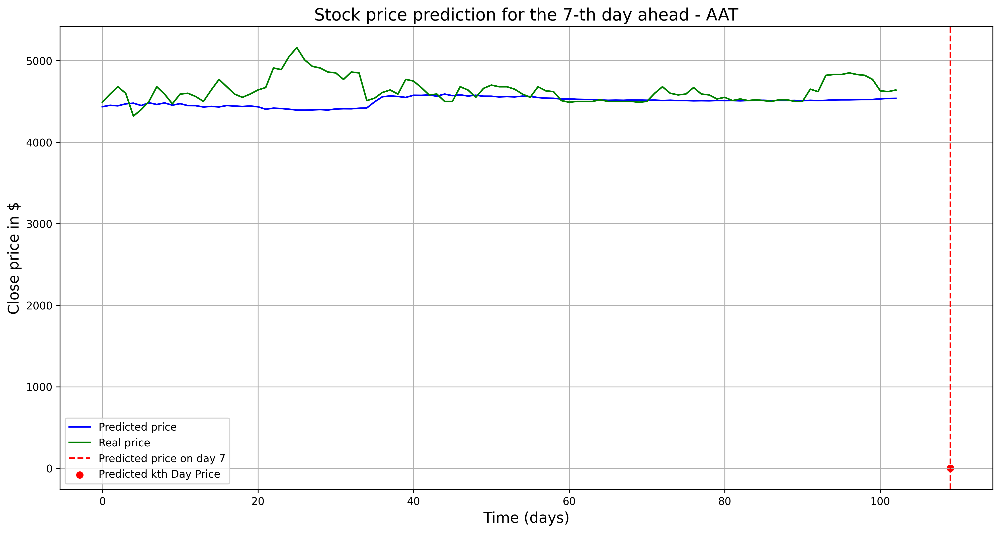

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (432, 30, 1)
y_train_norm shape:  (432, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_149 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_148 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_150 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_149 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_151 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_150 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_49 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_98 (Dense)                     │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_99 (Dense)                     │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0856 - mse: 0.0856 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0841 - mse: 0.0841 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0828 - mse: 0.0828 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0817 - mse: 0.0817 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0808 - mse: 0.0808 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0801 - mse: 0.0801 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0796 - mse: 0.0796 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0793 - mse: 0.0793 - val_loss: 0.0371 - val_mse: 0.0371
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0791 - mse: 0.0

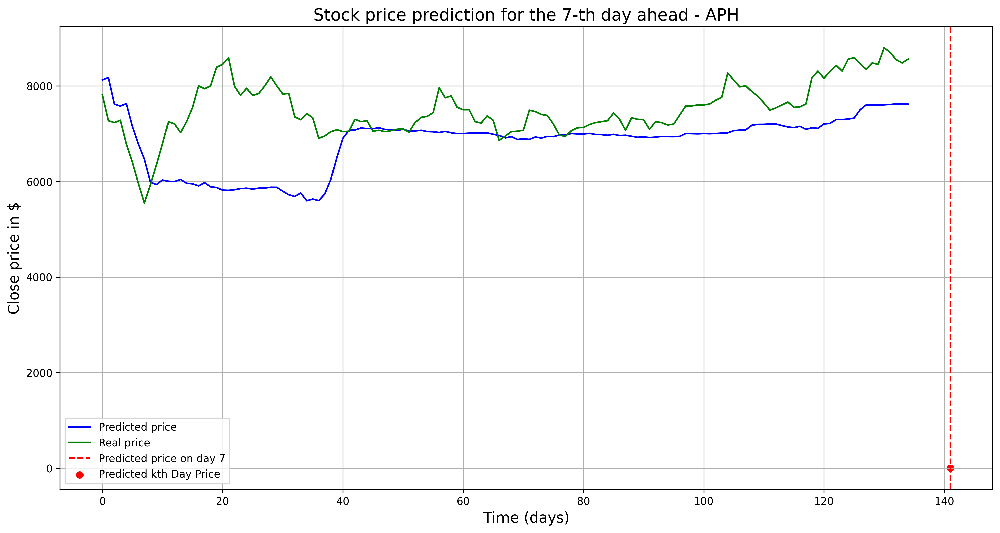

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (378, 30, 1)
y_train_norm shape:  (378, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_152 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_151 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_153 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_152 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_154 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_153 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_50 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_100 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_101 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0390 - mse: 0.0

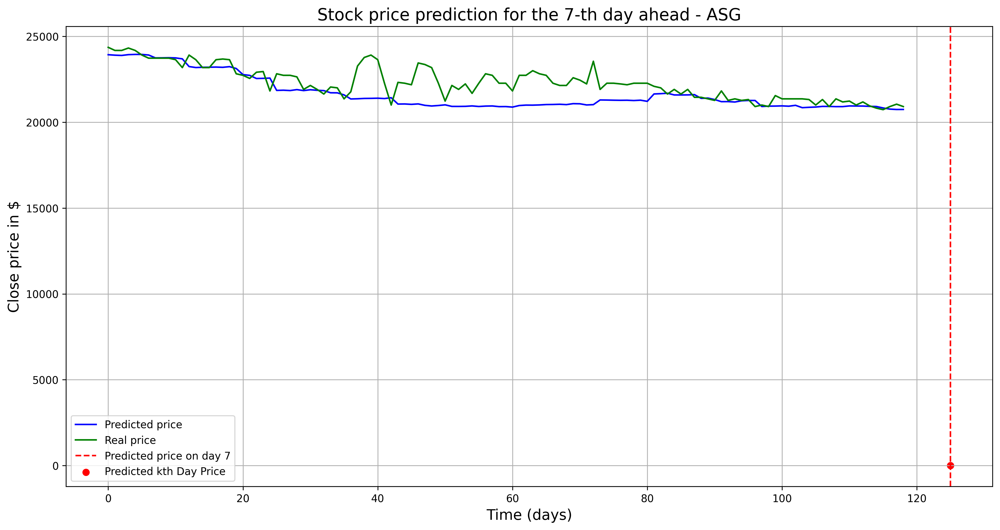

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_155 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_154 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_156 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_155 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_157 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_156 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_51 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_102 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_103 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 189ms/step - loss: 0.0667 - mse: 0.0667 - val_loss: 0.1204 - val_mse: 0.1204
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0638 - mse: 0.0638 - val_loss: 0.1156 - val_mse: 0.1156
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0655 - mse: 0.0655 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.0681 - mse: 0.0681 - val_loss: 0.1136 - val_mse: 0.1136
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.0673 - mse: 0.0673 - val_loss: 0.1145 - val_mse: 0.1145
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.1159 - val_mse: 0.1159
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0599 - mse: 0.0599 - val_loss: 0.1172 - val_mse: 0.1172
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0667 - mse: 0.0667 - val_loss: 0.1169 - val_mse: 0.1169
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0667 - mse: 0.0

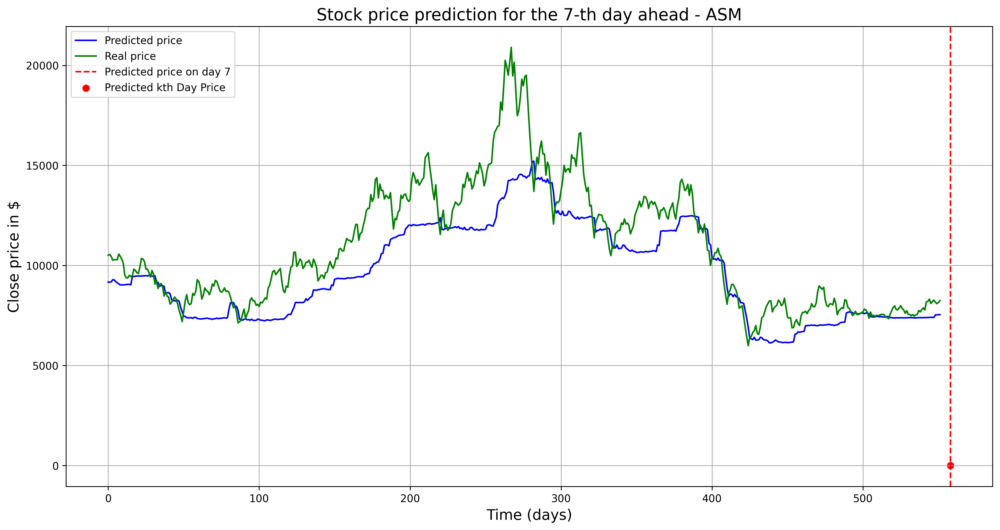

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1766, 30, 1)
y_train_norm shape:  (1766, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_158 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_157 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_159 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_158 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_160 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_159 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_52 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_104 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_105 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0852 - val_mse: 0.0852
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - loss: 0.0549 - mse: 0.0549 - val_loss: 0.0833 - val_mse: 0.0833
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0576 - mse: 0.0576 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0566 - mse: 0.0566 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0522 - mse: 0.0522 - val_loss: 0.0844 - val_mse: 0.0844
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0845 - val_mse: 0.0845
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0545 - mse: 0.0545 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0554 - mse: 0.055

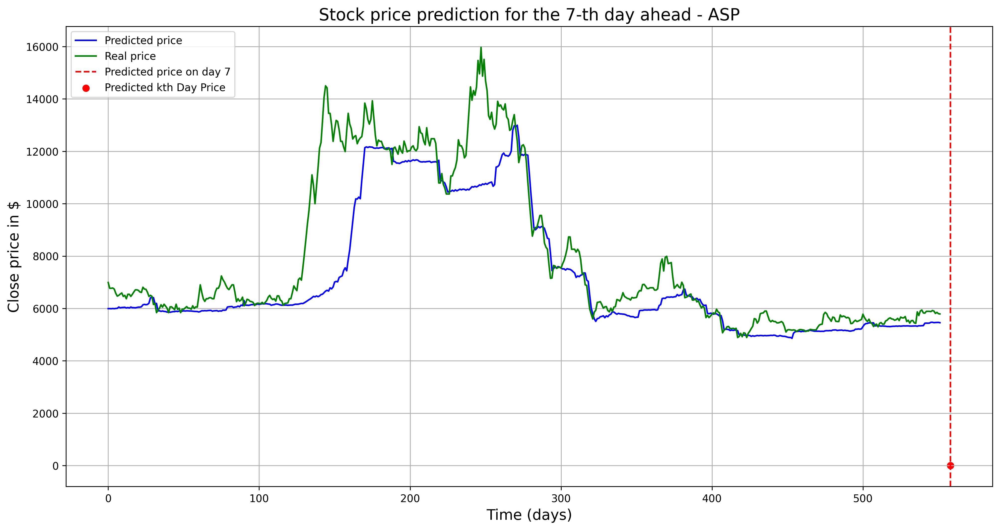

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1237, 30, 1)
y_train_norm shape:  (1237, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_161 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_160 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_162 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_161 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_163 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_162 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_53 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_106 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_107 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 814ms/step - loss: 0.0702 - mse: 0.0702 - val_loss: 0.1769 - val_mse: 0.1769
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0662 - mse: 0.0662 - val_loss: 0.1690 - val_mse: 0.1690
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0647 - mse: 0.0647 - val_loss: 0.1639 - val_mse: 0.1639
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.1615 - val_mse: 0.1615
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0710 - mse: 0.0710 - val_loss: 0.1611 - val_mse: 0.1611
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0649 - mse: 0.0649 - val_loss: 0.1623 - val_mse: 0.1623
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0697 - mse: 0.0697 - val_loss: 0.1644 - val_mse: 0.1644
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0720 - mse: 0.0720 - val_loss: 0.1668 - val_mse: 0.1668
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0703 - mse: 0.0703 

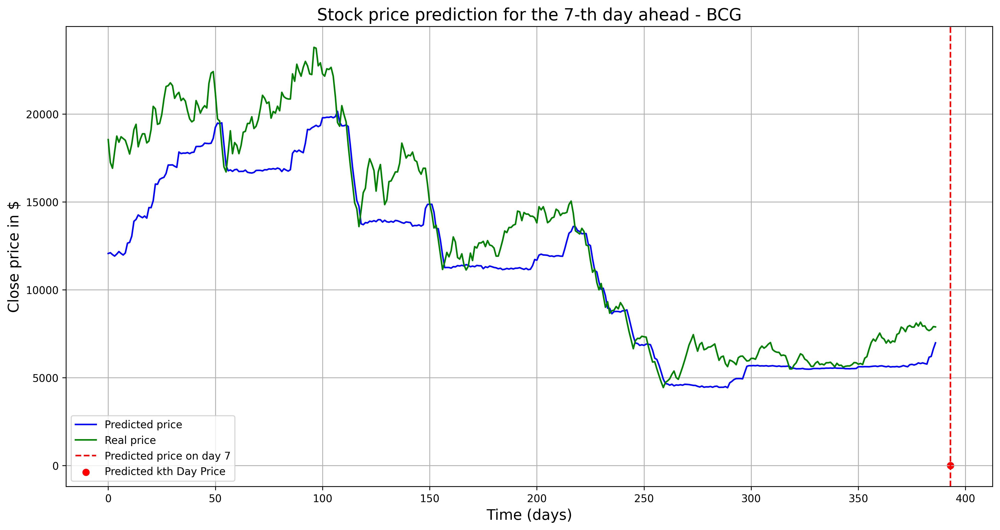

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_164 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_163 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_165 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_164 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_166 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_165 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_54 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_108 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_109 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 245ms/step - loss: 0.0845 - mse: 0.0845 - val_loss: 0.0725 - val_mse: 0.0725
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0733 - mse: 0.0733 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0784 - mse: 0.0784 - val_loss: 0.0714 - val_mse: 0.0714
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0745 - mse: 0.0745 - val_loss: 0.0717 - val_mse: 0.0717
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0738 - mse: 0.0738 - val_loss: 0.0715 - val_mse: 0.0715
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0725 - mse: 0.0725 - val_loss: 0.0712 - val_mse: 0.0712
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0758 - mse: 0.0758 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0717 - mse: 0.0717 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0725 - mse: 0.0725 -

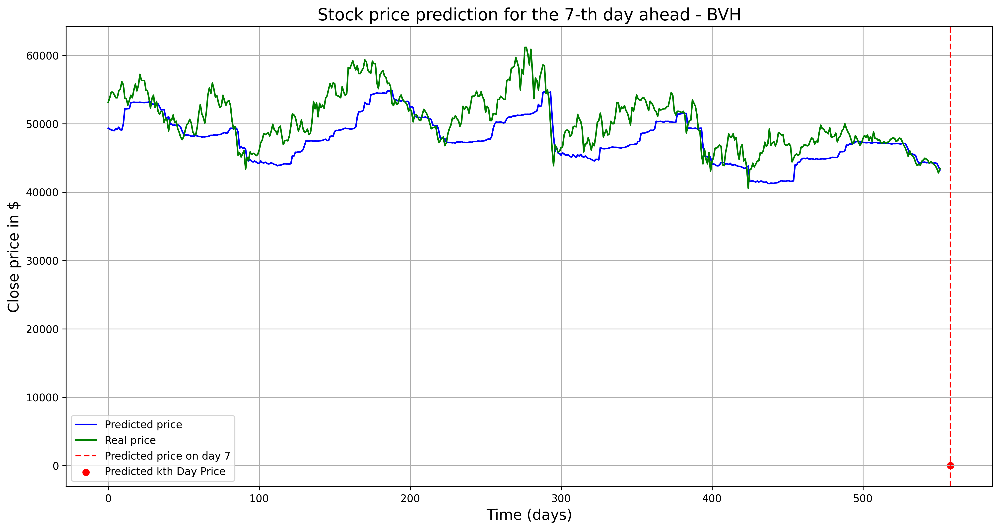

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (486, 30, 1)
y_train_norm shape:  (486, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_167 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_166 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_168 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_167 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_169 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_168 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_55 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_110 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_111 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1749 - mse: 0.1749 - val_loss: 0.1286 - val_mse: 0.1286
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step - loss: 0.1715 - mse: 0.1715 - val_loss: 0.1263 - val_mse: 0.1263
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.1683 - mse: 0.1683 - val_loss: 0.1242 - val_mse: 0.1242
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step - loss: 0.1653 - mse: 0.1653 - val_loss: 0.1223 - val_mse: 0.1223
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.1626 - mse: 0.1626 - val_loss: 0.1206 - val_mse: 0.1206
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.1600 - mse: 0.1600 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.1577 - mse: 0.1577 - val_loss: 0.1178 - val_mse: 0.1178
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.1555 - mse: 0.1555 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.1536 - mse: 0.1

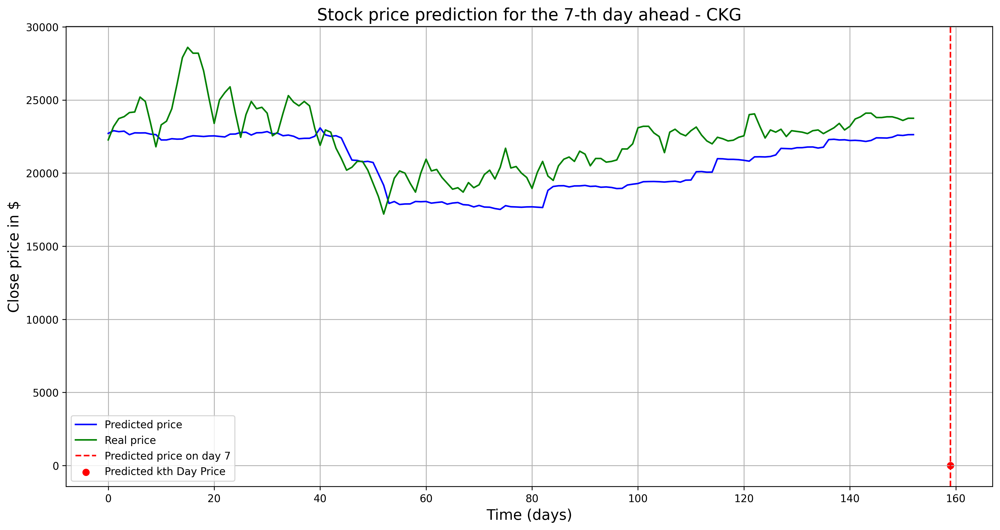

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1766, 30, 1)
y_train_norm shape:  (1766, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_170 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_169 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_171 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_170 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_172 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_171 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_56 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_112 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_113 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 172ms/step - loss: 0.0977 - mse: 0.0977 - val_loss: 0.0582 - val_mse: 0.0582
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0911 - mse: 0.0911 - val_loss: 0.0583 - val_mse: 0.0583
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0884 - mse: 0.0884 - val_loss: 0.0602 - val_mse: 0.0602
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0863 - mse: 0.0863 - val_loss: 0.0619 - val_mse: 0.0619
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0872 - mse: 0.0872 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0928 - mse: 0.0928 - val_loss: 0.0615 - val_mse: 0.0615
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0917 - mse: 0.0917 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0891 - mse: 0.0891 - val_loss: 0.0593 - val_mse: 0.0593
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - loss: 0.0807 - mse: 0.080

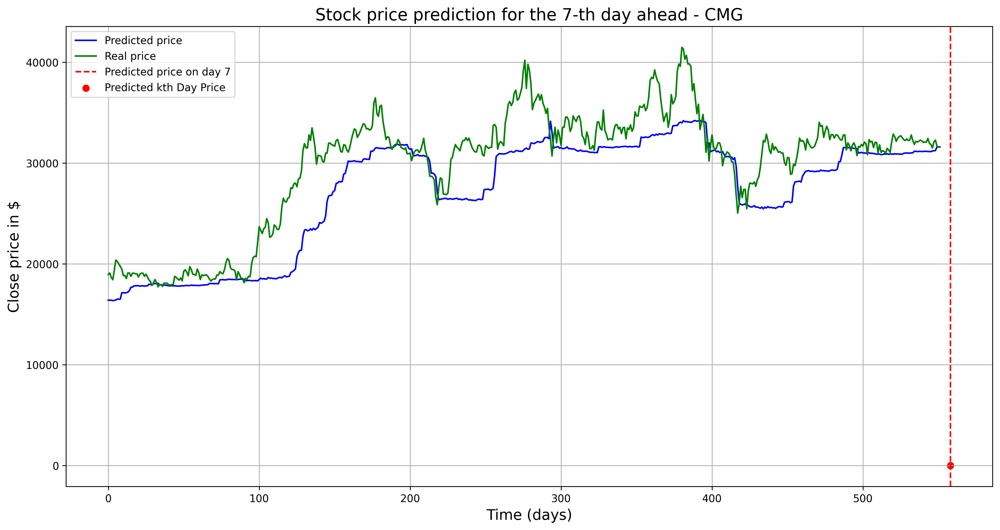

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_173 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_172 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_174 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_173 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_175 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_174 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_57 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_114 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_115 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 178ms/step - loss: 0.0704 - mse: 0.0704 - val_loss: 0.0707 - val_mse: 0.0707
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0708 - mse: 0.0708 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0645 - mse: 0.0645 - val_loss: 0.0701 - val_mse: 0.0701
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0683 - mse: 0.0683 - val_loss: 0.0703 - val_mse: 0.0703
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0680 - mse: 0.0680 - val_loss: 0.0699 - val_mse: 0.0699
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0671 - mse: 0.0671 - val_loss: 0.0697 - val_mse: 0.0697
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0699 - val_mse: 0.0699
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 0.0593 - mse: 0.0593 

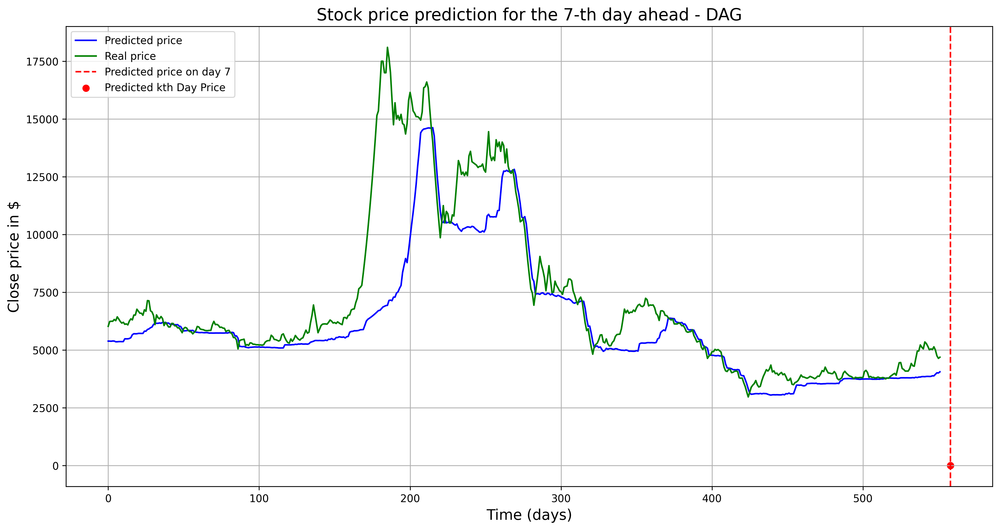

In [ ]:
# Assuming `corp_list` and `stock_codes` are already defined
for i in range(min(len(stock_codes), 10)):  # Only process the first 10 companies
    window_size = 30
    company_data = corp_list[i]
    company = stock_codes[i]
    k = 7

    # Call the kth_day_pipeline function
    kth_day_pipeline(company, company_data, window_size, k)

## k consecutive

In [ ]:
def predict_consecutive_days(company_data, window_size, model, X_predict, X_predict_norm, k):
    # Ensure that the model can predict multiple steps ahead
    predictions = []

    # Loop to predict k days ahead
    for i in range(k):
        # Get prediction
        y_pred_norm = model.predict(X_predict_norm)
        predictions.append(y_pred_norm[0])  # Collect the prediction

        # Prepare the next input based on the current prediction
        y_pred_reshaped = np.zeros((1, 1, X_predict_norm.shape[2]))  # Create a new array with the same feature size
        y_pred_reshaped[0, 0, :1] = y_pred_norm  # Fill only the first feature with the prediction

        # Concatenate the latest prediction as the new input
        X_predict_norm = np.concatenate((X_predict_norm[:, 1:, :], y_pred_reshaped), axis=1)  # Shift the window

    predictions = np.array(predictions).flatten()  # Flatten to 1D array for easier access

    return predictions  # Return all predictions for analysis


In [ ]:
def kth_consecutive_pipeline(company, company_data, window_size, k):
    X_data = []
    y_data = []

    ### Split the dataset into time windows to get data samples.
    split_into_windows(company_data, window_size, X_data, y_data)

    ### Train-Val-Test Split
    X_train, y_train, X_val, y_val, X_test, y_test = train_val_test_split(X_data, y_data, window_size)

    ### Normalizing training and validation data
    X_train_norm, y_train_norm, X_val_norm, y_val_norm = normalize(X_train, y_train, X_val, y_val)
    print("X_train_norm shape: ", X_train_norm.shape)
    print("y_train_norm shape: ", y_train_norm.shape)

    ### Create and train the model
    model = build_model(window_size)

    # Compile and train the model with Mean Squared Error loss function
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=['mse'])
    history = model.fit(X_train_norm, y_train_norm, validation_data=(X_val_norm, y_val_norm), epochs=10, batch_size=512)

    ### Normalizing test data
    X_test_norm = MinMaxScaling(X_test)
    y_test_norm = y_test.copy()
    for i in range(len(X_test)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_test_norm[i] = (y_test[i] - min_feature) / (max_feature - min_feature)

    ### Get prediction on the test data and convert the result back to stock price (i.e., de-normalization)
    y_pred_norm = model.predict(X_test_norm)
    print("MSE on the test set: ", mean_squared_error(y_pred_norm, y_test_norm))

    # Convert the result back to stock price (i.e., denormalization) for visualization purpose
    y_pred_denorm = np.zeros_like(y_pred_norm)  # Prepare an array for denormalized predictions
    for i in range(len(y_pred_denorm)):
        min_feature = np.min(X_test[i])
        max_feature = np.max(X_test[i])
        y_pred_denorm[i] = y_pred_norm[i] * (max_feature - min_feature) + min_feature

    ### Prediction for k-th day
    try:
        X_predict, X_predict_norm = generate_features_prediction(company_data, window_size)
    except Exception as e:
        print("Error generating features for prediction:", e)

    # Predicting prices for k consecutive days
    kth_day_stock_prices = predict_future_days(company_data, window_size, model, X_predict, X_predict_norm, k)
    print("Prediction process done!")

    # Visualize predicted stock price versus real stock price
    plt.figure(figsize=(16, 8), dpi=300)

    # Ensure y_pred_denorm has the correct length for plotting
    days_range = np.arange(len(y_pred_denorm))  # x-axis for predicted prices
    plt.plot(days_range, y_pred_denorm, label='Predicted price', color='blue')

    # Check the length of y_test to avoid size mismatch
    real_days_range = np.arange(len(y_test))  # x-axis for real prices
    plt.plot(real_days_range, y_test[:len(y_pred_denorm)], label='Real price', color='green')

    # Scatter plot and annotations for each of the k predicted days
    for i in range(k):
        predicted_day_index = len(y_pred_denorm) + i  # Index for the k-th day
        # Ensure kth_day_stock_prices[i] is accessed correctly as a single value
        predicted_price = kth_day_stock_prices[i] if np.ndim(kth_day_stock_prices) == 1 else kth_day_stock_prices[i][0]  # Change this line accordingly
        plt.scatter(predicted_day_index, predicted_price, color='red', label=f'Predicted Day {i+1}: ${predicted_price:.2f}')
        plt.annotate(f'${predicted_price:.2f}',
                    xy=(predicted_day_index, predicted_price),
                    xytext=(predicted_day_index + 0.5, predicted_price + 5),  # Adjust text position as needed
                    arrowprops=dict(facecolor='black', arrowstyle='->'),
                    fontsize=12)

    # Add vertical line for the k-th day prediction point
    plt.axvline(x=len(y_pred_denorm) + k - 1, color='red', linestyle='--', label=f'Forecast point for day {k}')

    plt.title(f'Stock Price Prediction for the Next {k} Days Ahead - {company}', fontsize=16)
    plt.xlabel('Time (days)', fontsize=14)
    plt.ylabel('Close Price in $', fontsize=14)
    plt.grid()  # Add grid
    plt.legend()  # Add legend
    plt.tight_layout()  # Adjust layout to make space for annotations
    plt.show()

X_train_norm shape:  (326, 30, 1)
y_train_norm shape:  (326, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_176 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_175 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_177 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_176 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_178 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_177 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_58 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_116 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_117 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0951 - mse: 0.0951 - val_loss: 9.9995e-05 - val_mse: 9.9995e-05
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0933 - mse: 0.0933 - val_loss: 3.9821e-04 - val_mse: 3.9821e-04
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0917 - mse: 0.0917 - val_loss: 8.8974e-04 - val_mse: 8.8974e-04
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0903 - mse: 0.0903 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0891 - mse: 0.0891 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0882 - mse: 0.0882 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0874 - mse: 0.0874 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0868 - mse: 0.0868 - val_loss: 0.0058 - val_mse: 0.0058
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - 

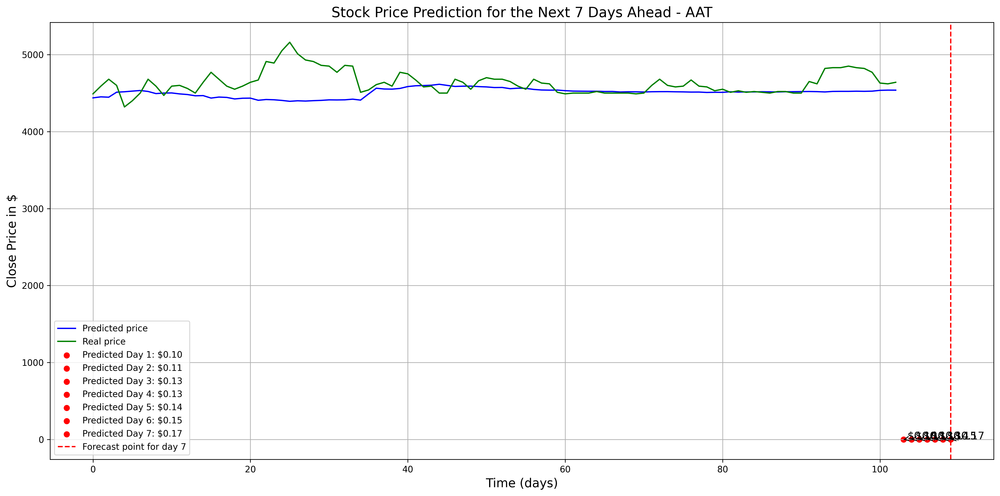

X_train_norm shape:  (432, 30, 1)
y_train_norm shape:  (432, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_179 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_178 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_180 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_179 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_181 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_180 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_59 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_118 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_119 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0856 - mse: 0.0856 - val_loss: 0.0364 - val_mse: 0.0364
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0841 - mse: 0.0841 - val_loss: 0.0360 - val_mse: 0.0360
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0828 - mse: 0.0828 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0817 - mse: 0.0817 - val_loss: 0.0357 - val_mse: 0.0357
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0808 - mse: 0.0808 - val_loss: 0.0358 - val_mse: 0.0358
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0801 - mse: 0.0801 - val_loss: 0.0361 - val_mse: 0.0361
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - loss: 0.0796 - mse: 0.0796 - val_loss: 0.0365 - val_mse: 0.0365
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - loss: 0.0793 - mse: 0.0793 - val_loss: 0.0371 - val_mse: 0.0371
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.0791 - mse: 0.0

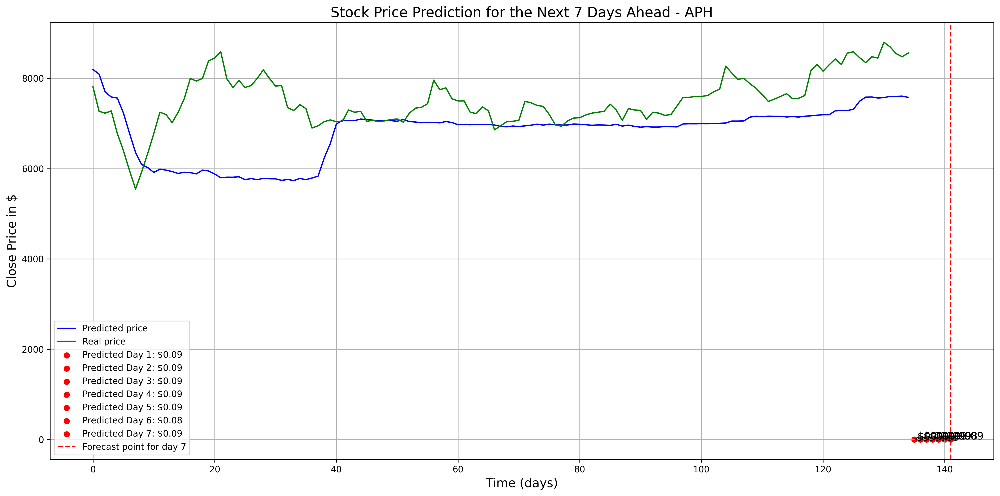

X_train_norm shape:  (378, 30, 1)
y_train_norm shape:  (378, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_182 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_181 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_183 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_182 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_184 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_183 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_60 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_120 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_121 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 0.0397 - mse: 0.0397 - val_loss: 0.0104 - val_mse: 0.0104
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0392 - mse: 0.0392 - val_loss: 0.0105 - val_mse: 0.0105
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0107 - val_mse: 0.0107
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0389 - mse: 0.0389 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0390 - mse: 0.0390 - val_loss: 0.0115 - val_mse: 0.0115
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0391 - mse: 0.0391 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0390 - mse: 0.0

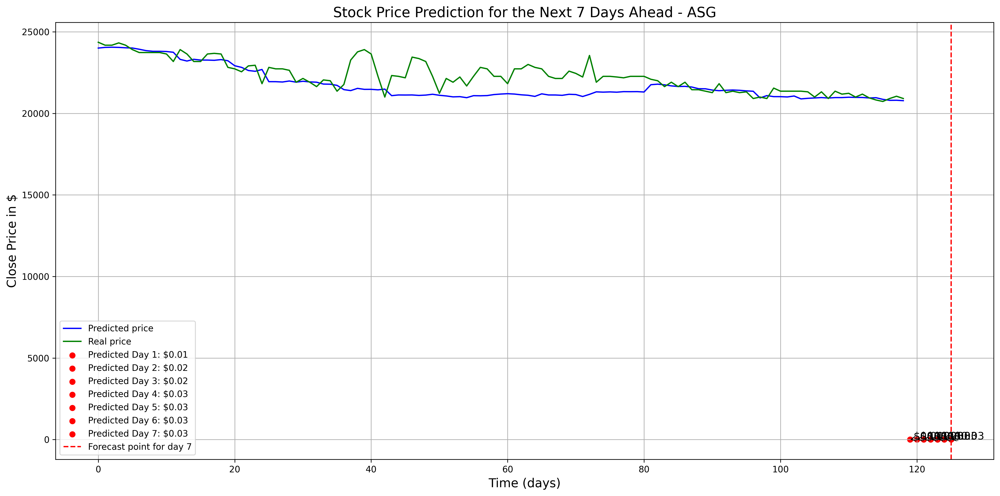

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_185 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_184 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_186 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_185 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_187 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_186 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_61 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_122 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_123 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0740 - mse: 0.0740 - val_loss: 0.1208 - val_mse: 0.1208
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0628 - mse: 0.0628 - val_loss: 0.1159 - val_mse: 0.1159
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0697 - mse: 0.0697 - val_loss: 0.1138 - val_mse: 0.1138
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0657 - mse: 0.0657 - val_loss: 0.1137 - val_mse: 0.1137
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0611 - mse: 0.0611 - val_loss: 0.1144 - val_mse: 0.1144
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0674 - mse: 0.0674 - val_loss: 0.1153 - val_mse: 0.1153
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0624 - mse: 0.0624 - val_loss: 0.1163 - val_mse: 0.1163
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0626 - mse: 0.0626 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0662 - mse: 0.0662 -

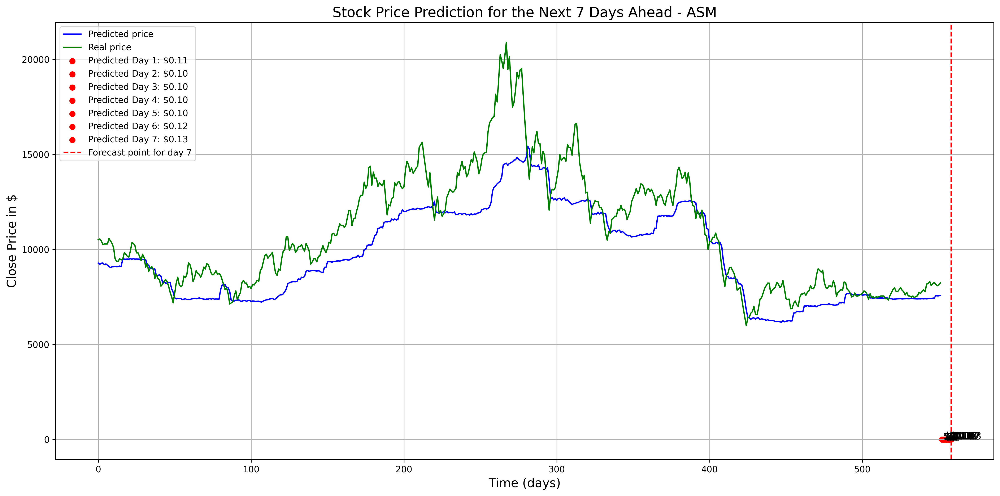

X_train_norm shape:  (1766, 30, 1)
y_train_norm shape:  (1766, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_188 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_187 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_189 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_188 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_190 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_189 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_62 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_124 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_125 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0610 - mse: 0.0610 - val_loss: 0.0854 - val_mse: 0.0854
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0548 - mse: 0.0548 - val_loss: 0.0834 - val_mse: 0.0834
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0570 - mse: 0.0570 - val_loss: 0.0831 - val_mse: 0.0831
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0559 - mse: 0.0559 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - loss: 0.0543 - mse: 0.0543 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0537 - mse: 0.0537 - val_loss: 0.0843 - val_mse: 0.0843
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0557 - mse: 0.0557 - val_loss: 0.0844 - val_mse: 0.0844
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0552 - mse: 0.0552 - val_loss: 0.0840 - val_mse: 0.0840
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0525 - mse: 0.0525 -

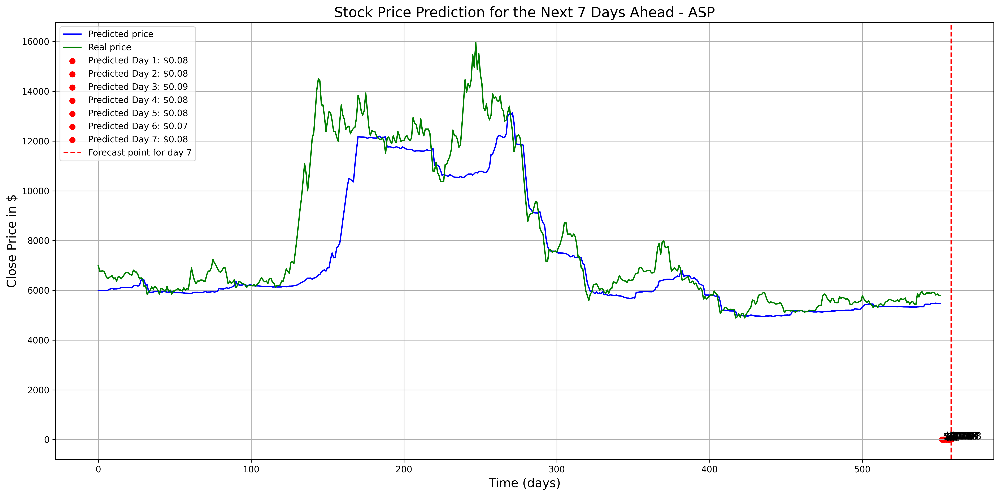

X_train_norm shape:  (1237, 30, 1)
y_train_norm shape:  (1237, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_191 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_190 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_192 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_191 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_193 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_192 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_63 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_126 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_127 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 208ms/step - loss: 0.0712 - mse: 0.0712 - val_loss: 0.1769 - val_mse: 0.1769
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0724 - mse: 0.0724 - val_loss: 0.1691 - val_mse: 0.1691
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0706 - mse: 0.0706 - val_loss: 0.1640 - val_mse: 0.1640
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0692 - mse: 0.0692 - val_loss: 0.1617 - val_mse: 0.1617
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0712 - mse: 0.0712 - val_loss: 0.1618 - val_mse: 0.1618
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0693 - mse: 0.0693 - val_loss: 0.1633 - val_mse: 0.1633
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0704 - mse: 0.0704 - val_loss: 0.1651 - val_mse: 0.1651
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0705 - mse: 0.0705 - val_loss: 0.1667 - val_mse: 0.1667
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0676 - mse: 0.0676 

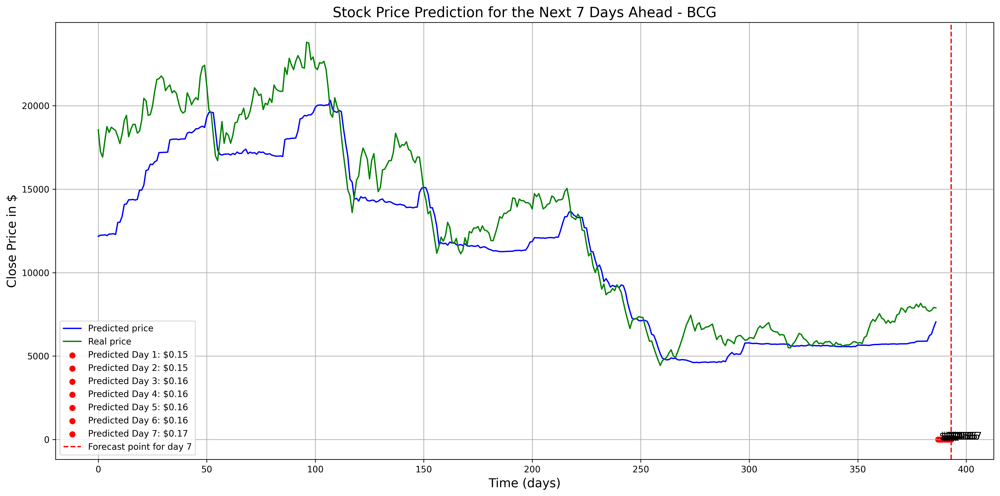

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_194 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_193 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_195 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_194 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_196 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_195 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_64 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_128 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_129 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 185ms/step - loss: 0.0774 - mse: 0.0774 - val_loss: 0.0724 - val_mse: 0.0724
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0751 - mse: 0.0751 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0747 - mse: 0.0747 - val_loss: 0.0716 - val_mse: 0.0716
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0729 - mse: 0.0729 - val_loss: 0.0720 - val_mse: 0.0720
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0761 - mse: 0.0761 - val_loss: 0.0717 - val_mse: 0.0717
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0773 - mse: 0.0773 - val_loss: 0.0713 - val_mse: 0.0713
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0749 - mse: 0.0749 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.0776 - mse: 0.0776 - val_loss: 0.0710 - val_mse: 0.0710
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0750 - mse: 0

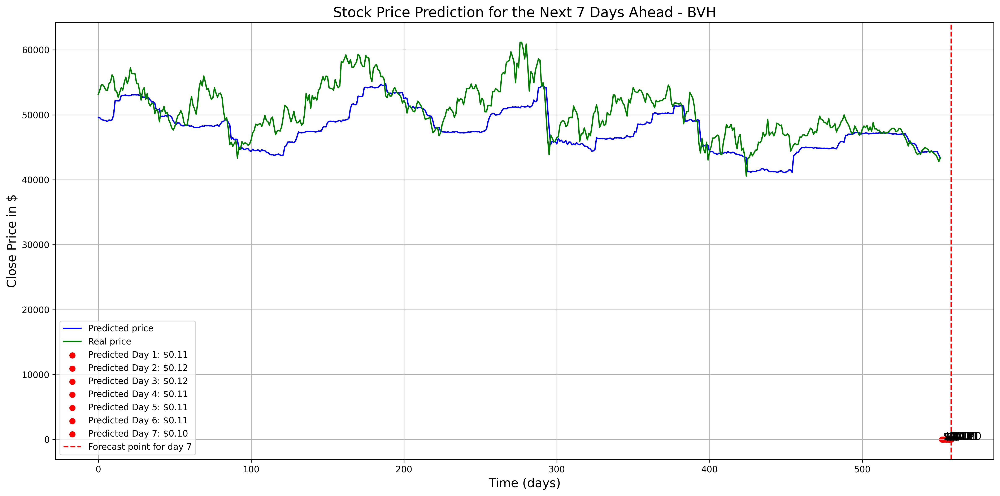

X_train_norm shape:  (486, 30, 1)
y_train_norm shape:  (486, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_197 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_196 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_198 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_197 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_199 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_198 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_65 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_130 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_131 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 0.1749 - mse: 0.1749 - val_loss: 0.1286 - val_mse: 0.1286
Epoch 2/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - loss: 0.1715 - mse: 0.1715 - val_loss: 0.1263 - val_mse: 0.1263
Epoch 3/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.1683 - mse: 0.1683 - val_loss: 0.1242 - val_mse: 0.1242
Epoch 4/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - loss: 0.1653 - mse: 0.1653 - val_loss: 0.1223 - val_mse: 0.1223
Epoch 5/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - loss: 0.1626 - mse: 0.1626 - val_loss: 0.1206 - val_mse: 0.1206
Epoch 6/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - loss: 0.1600 - mse: 0.1600 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 7/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.1577 - mse: 0.1577 - val_loss: 0.1178 - val_mse: 0.1178
Epoch 8/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.1555 - mse: 0.1555 - val_loss: 0.1167 - val_mse: 0.1167
Epoch 9/10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - loss: 0.1536 - mse: 0.1

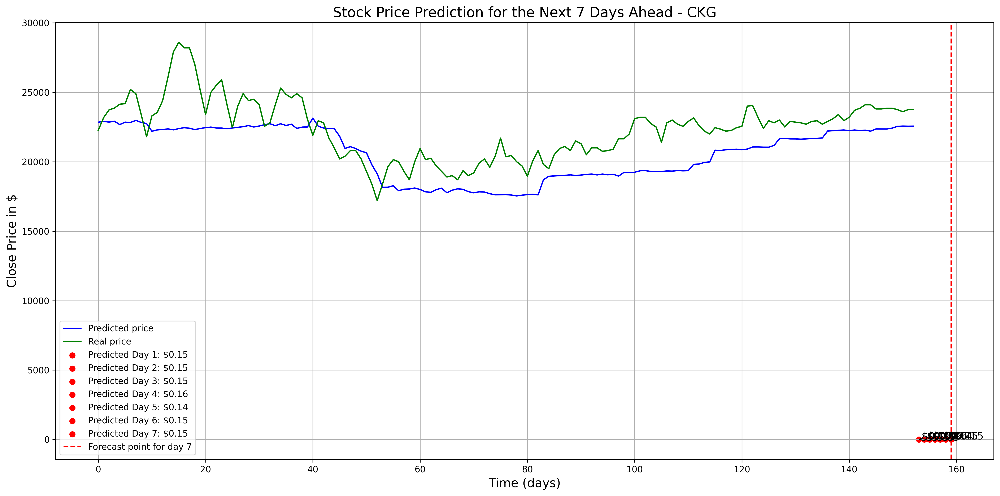

X_train_norm shape:  (1766, 30, 1)
y_train_norm shape:  (1766, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_200 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_199 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_201 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_200 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_202 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_201 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_66 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_132 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_133 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.1016 - mse: 0.1016 - val_loss: 0.0582 - val_mse: 0.0582
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 126ms/step - loss: 0.0921 - mse: 0.0921 - val_loss: 0.0582 - val_mse: 0.0582
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0850 - mse: 0.0850 - val_loss: 0.0601 - val_mse: 0.0601
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0948 - mse: 0.0948 - val_loss: 0.0623 - val_mse: 0.0623
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0909 - mse: 0.0909 - val_loss: 0.0629 - val_mse: 0.0629
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0944 - mse: 0.0944 - val_loss: 0.0622 - val_mse: 0.0622
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.0878 - mse: 0.0878 - val_loss: 0.0608 - val_mse: 0.0608
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0861 - mse: 0.0861 - val_loss: 0.0597 - val_mse: 0.0597
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0917 - mse: 0

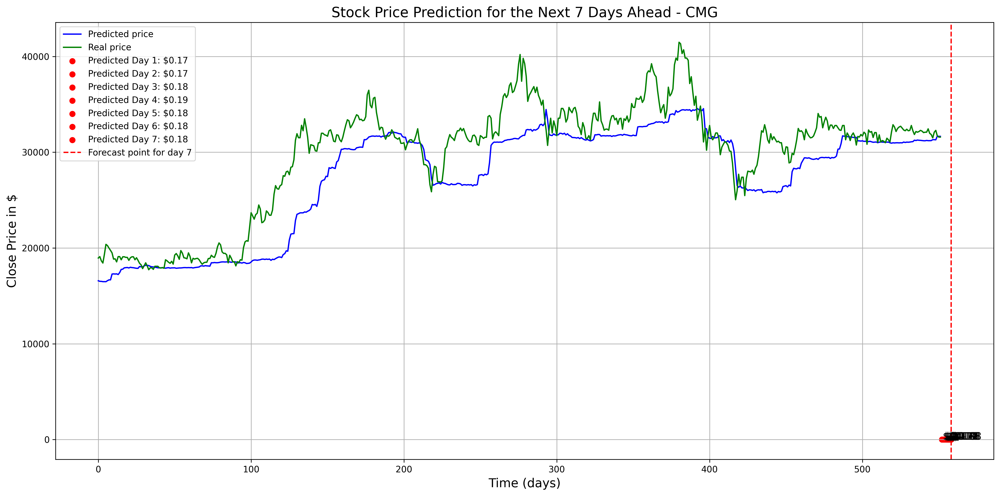

X_train_norm shape:  (1765, 30, 1)
y_train_norm shape:  (1765, 1)


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_203 (Conv1D)                  │ (None, 30, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_202 (MaxPooling1D)     │ (None, 15, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_204 (Conv1D)                  │ (None, 15, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_203 (MaxPooling1D)     │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_205 (Conv1D)                  │ (None, 7, 64)               │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_204 (MaxPooling1D)     │ (None, 3, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_67 (Flatten)                 │ (None, 192)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_134 (Dense)                    │ (None, 100)                 │          19,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_135 (Dense)                    │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,001 (269.54 KB)

 Trainable params: 69,001 (269.54 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 190ms/step - loss: 0.0644 - mse: 0.0644 - val_loss: 0.0707 - val_mse: 0.0707
Epoch 2/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0640 - mse: 0.0640 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 3/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - loss: 0.0641 - mse: 0.0641 - val_loss: 0.0703 - val_mse: 0.0703
Epoch 4/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0717 - mse: 0.0717 - val_loss: 0.0703 - val_mse: 0.0703
Epoch 5/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0666 - mse: 0.0666 - val_loss: 0.0699 - val_mse: 0.0699
Epoch 6/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0659 - mse: 0.0659 - val_loss: 0.0698 - val_mse: 0.0698
Epoch 7/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 109ms/step - loss: 0.0646 - mse: 0.0646 - val_loss: 0.0699 - val_mse: 0.0699
Epoch 8/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0631 - mse: 0.0631 - val_loss: 0.0699 - val_mse: 0.0699
Epoch 9/10
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0644 - mse: 0

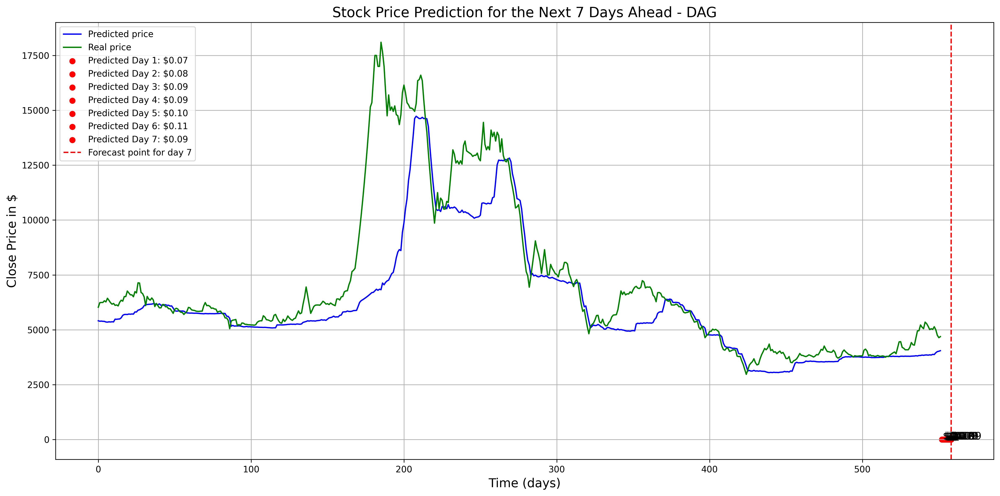

In [ ]:
# Assuming `corp_list` and `stock_codes` are already defined
for i in range(min(len(vnindex30), 10)):  # Only process the first 10 companies
    window_size = 30
    company_data = corp_list[i]
    company = stock_codes[i]
    k = 7

    # Call the kth_day_pipeline function
    kth_consecutive_pipeline(company, company_data, window_size, k)

# Task 3

In [ ]:
import seaborn as sns
sns.set()

In [ ]:
comp = corp_list[30].copy()
comp

,time,open,high,low,close,volume,ticker
0,2012-03-20,4350,4380,4330,4380,11890,PAN
1,2012-03-21,4380,4490,4380,4490,2960,PAN
2,2012-03-22,4270,4460,4270,4460,14800,PAN
3,2012-03-23,4300,4300,4300,4300,7300,PAN
4,2012-03-26,4300,4380,4160,4380,25760,PAN
...,...,...,...,...,...,...,...
2778,2023-05-18,17630,17730,17240,17330,798300,PAN
2779,2023-05-19,17240,17530,17240,17380,863600,PAN
2780,2023-05-22,17380,17630,17330,17430,1165900,PAN
2781,2023-05-23,17430,17680,17430,17530,687000,PAN


# 2. Trading point prediction using LSTM

In [ ]:
window = 30

In [ ]:
comp

,time,open,high,low,close,volume,ticker
0,2012-03-20,4350,4380,4330,4380,11890,PAN
1,2012-03-21,4380,4490,4380,4490,2960,PAN
2,2012-03-22,4270,4460,4270,4460,14800,PAN
3,2012-03-23,4300,4300,4300,4300,7300,PAN
4,2012-03-26,4300,4380,4160,4380,25760,PAN
...,...,...,...,...,...,...,...
2778,2023-05-18,17630,17730,17240,17330,798300,PAN
2779,2023-05-19,17240,17530,17240,17380,863600,PAN
2780,2023-05-22,17380,17630,17330,17430,1165900,PAN
2781,2023-05-23,17430,17680,17430,17530,687000,PAN


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

# Select only the numeric columns
data = comp[['open', 'high', 'low', 'close']]  # Adjust based on your actual numeric column names

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)

# Split the data into training and testing sets
train_data, test_data = train_test_split(scaled_data, test_size=0.2, shuffle=False)

print("Training data shape:", train_data.shape)
print("Testing data shape:", test_data.shape)


Training data shape: (2226, 4)
Testing data shape: (557, 4)


In [ ]:
data['difference'] = data['close'] - data['open']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
# Define thresholds for price change
buy_threshold = 0.01
sell_threshold = -0.01

# Generate labels based on price change
price_change = data['close'].pct_change()
labels = np.zeros_like(price_change)
labels[price_change > buy_threshold] = 1  # Buy
labels[price_change < sell_threshold] = -1  # Sell

In [ ]:
from keras.utils import to_categorical

# Convert labels to one-hot encoding
labels = np.where(labels == 1, 1, 0)  # Convert 1s and -1s to 0s and 1s
labels = to_categorical(labels, num_classes=3)  # One-hot encode (0, 1, 2)

# Split the data into training and testing sets
train_data, test_data = train_test_split(scaled_data, test_size=0.2, shuffle=False)

# Prepare the training data
X_train = []
y_train = []

for i in range(window, len(train_data)):
    X_train.append(train_data[i-window:i, :])  # Using all features
    y_train.append(labels[i])  # Labels should be aligned with output

X_train, y_train = np.array(X_train), np.array(y_train)

# Train-test split for training data
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=False)


In [ ]:
# Define the model architecture
model = Sequential()
model.add(LSTM(64, input_shape=(window, 4)))  # 4 features: open, high, low, close
model.add(Dense(3, activation='softmax'))  # 3 classes for buy, sell, hold
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
              loss='mse', metrics=['mse'])


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.


In [ ]:
data

,open,high,low,close,difference
0,4350,4380,4330,4380,30
1,4380,4490,4380,4490,110
2,4270,4460,4270,4460,190
3,4300,4300,4300,4300,0
4,4300,4380,4160,4380,80
...,...,...,...,...,...
2778,17630,17730,17240,17330,-300
2779,17240,17530,17240,17380,140
2780,17380,17630,17330,17430,50
2781,17430,17680,17430,17530,100


In [ ]:
# Train the model
history = model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs=15, batch_size=1024)

Epoch 1/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 514ms/step - loss: 0.1983 - mse: 0.1983 - val_loss: 0.1084 - val_mse: 0.1084
Epoch 2/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.1295 - mse: 0.1295 - val_loss: 0.1033 - val_mse: 0.1033
Epoch 3/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - loss: 0.1170 - mse: 0.1170 - val_loss: 0.1173 - val_mse: 0.1173
Epoch 4/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.1250 - mse: 0.1250 - val_loss: 0.0990 - val_mse: 0.0990
Epoch 5/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.1146 - mse: 0.1146 - val_loss: 0.0991 - val_mse: 0.0991
Epoch 6/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.1187 - mse: 0.1187 - val_loss: 0.0991 - val_mse: 0.0991
Epoch 7/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step - loss: 0.1174 - mse: 0.1174 - val_loss: 0.0983 - val_mse: 0.0983
Epoch 8/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - loss: 0.1156 - mse: 0.1156 - val_loss: 0.0993 - val_mse: 0.0993
Epoch 9/15
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - loss: 0.1151 - mse: 

In [ ]:
# Prepare the testing data
X_test = []
y_test = []

for i in range(window, len(test_data)):
    X_test.append(test_data[i-window:i, 0:])
    y_test.append(labels[i])

X_test, y_test = np.array(X_test), np.array(y_test)

# Evaluate the model
y_pred = model.predict(X_test)
print("MSE on the test set: ", mean_squared_error(y_pred, y_test))


17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
MSE on the test set:  0.13231264914840074


In [ ]:
for i in range(len(y_pred)):
  if (max(y_pred[i]) == y_pred[i][0]):
    y_pred[i] = -1
  elif (max(y_pred[i] == y_pred[i][1])):
    y_pred[i] = 0
  else:
    y_pred[i] = 1

In [ ]:
y_pred[10]

array([-1., -1., -1.], dtype=float32)

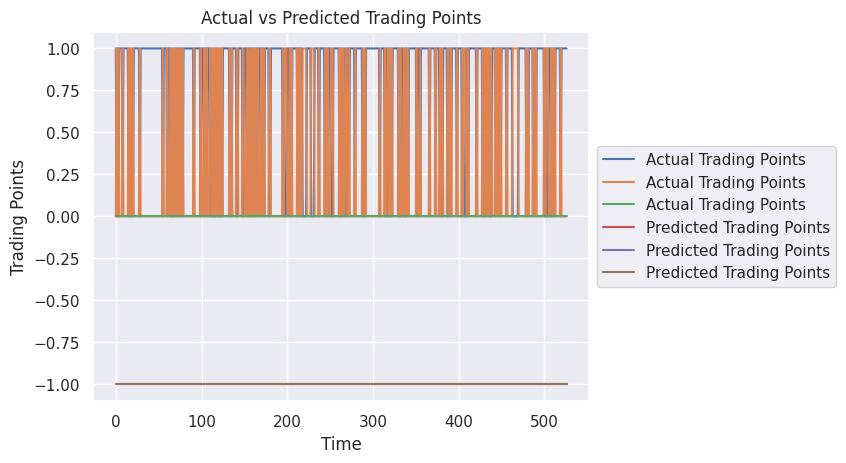

In [ ]:
import matplotlib.pyplot as plt

# Plotting the actual trading points
plt.plot(y_test, label='Actual Trading Points')

# Plotting the predicted trading points
plt.plot(y_pred, label='Predicted Trading Points')

plt.xlabel('Time')
plt.ylabel('Trading Points')
plt.title('Actual vs Predicted Trading Points')
# plt.legend()
# legend on the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


# 3. Using crossover between different SMAs

In [ ]:
comp

,time,open,high,low,close,volume,ticker,50days,200days,signal,positions
0,2012-03-20,4350,4380,4330,4380,11890,PAN,NaN,NaN,0,NaN
1,2012-03-21,4380,4490,4380,4490,2960,PAN,NaN,NaN,0,0.0
2,2012-03-22,4270,4460,4270,4460,14800,PAN,NaN,NaN,0,0.0
3,2012-03-23,4300,4300,4300,4300,7300,PAN,NaN,NaN,0,0.0
4,2012-03-26,4300,4380,4160,4380,25760,PAN,NaN,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2778,2023-05-18,17630,17730,17240,17330,798300,PAN,17013.78,18103.035,0,0.0
2779,2023-05-19,17240,17530,17240,17380,863600,PAN,17046.98,18078.035,0,0.0
2780,2023-05-22,17380,17630,17330,17430,1165900,PAN,17078.38,18049.135,0,0.0
2781,2023-05-23,17430,17680,17430,17530,687000,PAN,17101.98,18019.285,0,0.0


In [ ]:
import numpy as np

comp['50days'] = comp["close"].rolling(50).mean()
comp['200days'] = comp["close"].rolling(200).mean()

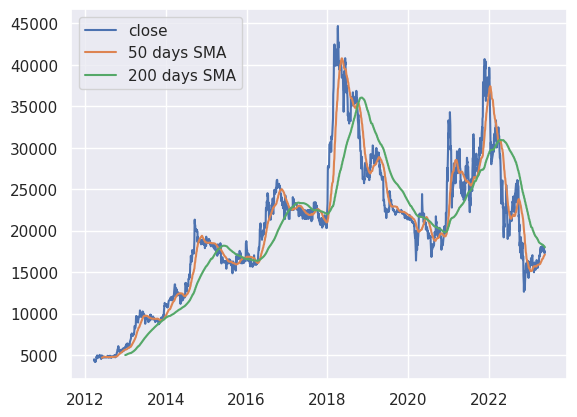

In [ ]:
plt.plot(comp['time'], comp['close'], label = 'close')
plt.plot(comp['time'], comp['50days'], label = '50 days SMA')
plt.plot(comp['time'], comp['200days'], label = '200 days SMA')
plt.legend()
plt.show()

In [ ]:
comp['signal'] = 0
comp['signal'][50:] = np.where(comp['50days'][50:]
                                            > comp['200days'][50:], 1.0, 0.0)
comp['positions'] = comp['signal'].diff()

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
comp[200:]

,time,open,high,low,close,volume,ticker,50days,200days,signal,positions
200,2013-01-02,5990,6140,5990,6140,13520,PAN,5657.60,5005.150,1,0.0
201,2013-01-03,6140,6140,5850,6110,800,PAN,5664.00,5013.250,1,0.0
202,2013-01-04,5820,6260,5820,6140,4580,PAN,5667.60,5021.650,1,0.0
203,2013-01-07,6110,6290,5880,6290,15970,PAN,5675.20,5031.600,1,0.0
204,2013-01-08,5990,6350,5990,6350,1020,PAN,5680.80,5041.450,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...
2778,2023-05-18,17630,17730,17240,17330,798300,PAN,17013.78,18103.035,0,0.0
2779,2023-05-19,17240,17530,17240,17380,863600,PAN,17046.98,18078.035,0,0.0
2780,2023-05-22,17380,17630,17330,17430,1165900,PAN,17078.38,18049.135,0,0.0
2781,2023-05-23,17430,17680,17430,17530,687000,PAN,17101.98,18019.285,0,0.0


In [ ]:
### Reference: https://github.com/huseinzol05/Stock-Prediction-Models/blob/master/agent/2.moving-average-agent.ipynb
def buy_stock(
    real_movement,
    signal,
    initial_money = 10000,
    max_buy = 1,
    max_sell = 1,
):
    """
    real_movement = actual movement in the real world
    delay = how much interval you want to delay to change our decision from buy to sell, vice versa
    initial_state = 1 is buy, 0 is sell
    initial_money = 1000, ignore what kind of currency
    max_buy = max quantity for share to buy
    max_sell = max quantity for share to sell
    """
    starting_money = initial_money
    states_sell = []
    states_buy = []
    current_inventory = 0

    def buy(i, initial_money, current_inventory):
        shares = initial_money // real_movement[i]
        if shares < 1:
            print(
                'day %d: total balances %f, not enough money to buy a unit price %f'
                % (i, initial_money, real_movement[i])
            )
        else:
            if shares > max_buy:
                buy_units = max_buy
            else:
                buy_units = shares
            initial_money -= buy_units * real_movement[i]
            current_inventory += buy_units
            print(
                'day %d: buy %d units at price %f, total balance %f'
                % (i, buy_units, buy_units * real_movement[i], initial_money)
            )
            states_buy.append(0)
        return initial_money, current_inventory

    for i in range(real_movement.shape[0] - int(0.025 * len(comp))):
        state = signal[i]
        if state == 1:
            initial_money, current_inventory = buy(
                i, initial_money, current_inventory
            )
            states_buy.append(i)
        elif state == -1:
            if current_inventory == 0:
                    print('day %d: cannot sell anything, inventory 0' % (i))
            else:
                if current_inventory > max_sell:
                    sell_units = max_sell
                else:
                    sell_units = current_inventory
                current_inventory -= sell_units
                total_sell = sell_units * real_movement[i]
                initial_money += total_sell
                try:
                    invest = (
                        (real_movement[i] - real_movement[states_buy[-1]])
                        / real_movement[states_buy[-1]]
                    ) * 100
                except:
                    invest = 0
                print(
                    'day %d, sell %d units at price %f, investment %f %%, total balance %f,'
                    % (i, sell_units, total_sell, invest, initial_money)
                )
            states_sell.append(i)
    invest = ((initial_money - starting_money) / starting_money) * 100
    total_gains = initial_money - starting_money
    return states_buy, states_sell, total_gains, invest

In [ ]:
states_buy, states_sell, total_gains, invest = buy_stock(comp.close, comp['positions'])

day 199: buy 1 units at price 5850.000000, total balance 4150.000000
day 771, sell 1 units at price 17480.000000, investment 198.803419 %, total balance 21630.000000,
day 924: buy 1 units at price 16379.000000, total balance 5251.000000
day 995, sell 1 units at price 15900.000000, investment -2.924476 %, total balance 21151.000000,
day 1023: buy 1 units at price 20130.000000, total balance 1021.000000
day 1214, sell 1 units at price 22750.000000, investment 13.015400 %, total balance 23771.000000,
day 1375: buy 1 units at price 22770.000000, total balance 1001.000000
day 1403, sell 1 units at price 20920.000000, investment -8.124726 %, total balance 21921.000000,
day 1455: total balances 21921.000000, not enough money to buy a unit price 27690.000000
day 1635: cannot sell anything, inventory 0
day 2048: buy 1 units at price 21010.000000, total balance 911.000000
day 2065, sell 1 units at price 19180.000000, investment -8.710138 %, total balance 20091.000000,
day 2187: total balances 20

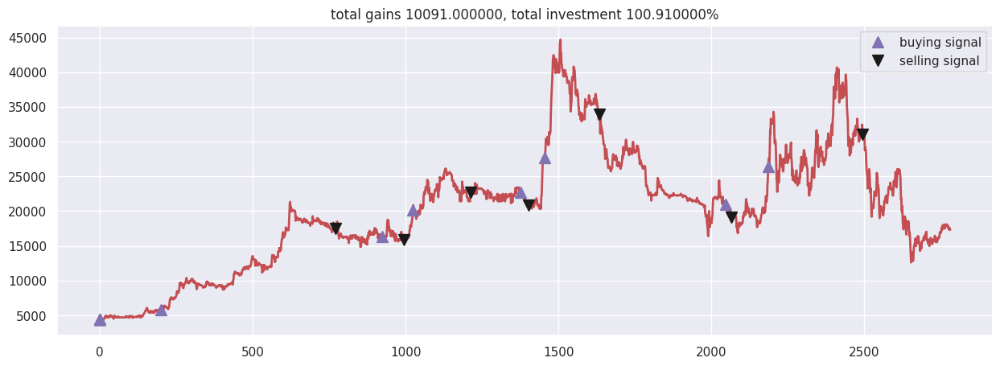

In [ ]:
close = comp['close']
fig = plt.figure(figsize = (15,5))
plt.plot(close, color='r', lw=2.)
plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
plt.title('total gains %f, total investment %f%%'%(total_gains, invest))
plt.legend()
plt.show()